# IMPORT LIBRARIES AND DATASET

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math

import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as pyoff

from datetime import datetime

from scipy.stats import skew
from scipy.stats import kurtosis

# Ignores any warning
# import warnings
# warnings.filterwarnings("ignore")

plt.style.use('seaborn')
sns.set(rc={'figure.figsize':(15, 8)})
sns.set_style("whitegrid")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('float_format', '{:f}'.format)

# from matplotlib import rcParams
# rcParams['figure.figsize'] = 12, 4
# rcParams['lines.linewidth'] = 3
# rcParams['xtick.labelsize'] = 'x-large'
# rcParams['ytick.labelsize'] = 'x-large'

import matplotlib as mp
%matplotlib inline
import textwrap
import matplotlib.ticker as mticker
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec

<ipython-input-1-7005991db0a6>:20: MatplotlibDeprecationWarning:

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/data/marketing_campaign_data.csv')

# **ABOUT DATASET**

Dataset Description:

The training dataset contains 2240 samples. Contains 28 features and 1 target boolean variable "Response" :

Accepted/Responses Campaign

* AcceptedCmp1 - 1 if customer accepted the offer in the 1st campaign, 0 otherwise
* AcceptedCmp2 - 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
* AcceptedCmp3 - 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
* AcceptedCmp4 - 1 if customer accepted the offer in the 4th campaign, 0 otherwise
* AcceptedCmp5 - 1 if customer accepted the offer in the 5th campaign, 0 otherwise
* Response (target) - 1 if customer accepted the offer in the last campaign, 0 otherwise
* Complain - 1 if customer complained in the previous 2 years

Customer Information

* ID - Customer's id
* Year_Birth - Customer's year of birth
* Education - customer’s level of education
* Marital - customer’s marital status
* Kidhome - number of small children in customer’s household
* Teenhome - number of teenagers in customer’s household
* Income - customer’s yearly household income
* DtCustomer - date of customer’s enrolment with the company
* Recency - number of days since the last purchase

Sales Product Type

* MntFishProducts - amount spent on fish products in the last 2 years
* MntMeatProducts - amount spent on meat products in the last 2 years
* MntFruits - amount spent on fruits products in the last 2 years
* MntSweetProducts - amount spent on sweet products in the last 2 years
* MntWines - amount spent on wine products in the last 2 years
* MntGoldProds - amount spent on gold products in the last 2 years

Number of Purchases per Type

* NumDealsPurchases - number of purchases made with discount
* NumCatalogPurchases - number of purchases made using catalogue
* NumStorePurchases - number of purchases made directly in stores
* NumWebPurchases - number of purchases made through company’s web site
* NumWebVisitsMonth - number of visits to company’s web site in the last month

Cost and Revenue

* Z_CostContact = 3 (Cost to contact a customer)
* Z_Revenue = 11 (Revenue after client accepting campaign)

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           2240 non-null   int64  
 1   ID                   2240 non-null   int64  
 2   Year_Birth           2240 non-null   int64  
 3   Education            2240 non-null   object 
 4   Marital_Status       2240 non-null   object 
 5   Income               2216 non-null   float64
 6   Kidhome              2240 non-null   int64  
 7   Teenhome             2240 non-null   int64  
 8   Dt_Customer          2240 non-null   object 
 9   Recency              2240 non-null   int64  
 10  MntCoke              2240 non-null   int64  
 11  MntFruits            2240 non-null   int64  
 12  MntMeatProducts      2240 non-null   int64  
 13  MntFishProducts      2240 non-null   int64  
 14  MntSweetProducts     2240 non-null   int64  
 15  MntGoldProds         2240 non-null   i

In [ ]:
cat_cols = ['ID', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5',
            'Complain', 'Response', 'Income_sgmt', 'Age_group', 'Has_child', 'Marital_Status_Simple', 'Education_Simple']

num_cols = ['Year_Birth', 'Income', 'Kidhome', 'Teenhome', 'Recency', 'MntCoke', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
            'MntGoldProds','NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Z_CostContact', 'Z_Revenue',
            'Age', 'Dependents', 'Spending', 'Conversion_rate_web', 'Total_Purchases', 'Total_Cmp', 'Ever_Accept']

timestamp = ["Dt_Customer"]

In [ ]:
data.head()

,Unnamed: 0,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,0,5524,1957,S1,Lajang,58138000.000000,0,0,04-09-2012,58,635000,88000,546000,172000,88000,88000,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,1,2174,1954,S1,Lajang,46344000.000000,1,1,08-03-2014,38,11000,1000,6000,2000,1000,6000,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,2,4141,1965,S1,Bertunangan,71613000.000000,0,0,21-08-2013,26,426000,49000,127000,111000,21000,42000,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,3,6182,1984,S1,Bertunangan,26646000.000000,1,0,10-02-2014,26,11000,4000,20000,10000,3000,5000,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,4,5324,1981,S3,Menikah,58293000.000000,1,0,19-01-2014,94,173000,43000,118000,46000,27000,15000,5,5,3,6,5,0,0,0,0,0,0,3,11,0


# **DUPLICATED ROWS AND MISSING VALUES**

## Duplicated Rows

In [ ]:
data.duplicated().sum()

0

## Missing Values

In [ ]:
print('Missing values status:', data.isnull().values.any())
nvc = pd.DataFrame(data.isnull().sum().sort_values(), columns=['Total Null Values'])
nvc['Percentage'] = (nvc['Total Null Values']/data.shape[0])*100
nvc["Data Type"] = [data[col].dtype for col in data.columns]
nvc.sort_values(by=["Total Null Values", "Percentage"], ascending=False, inplace=True)
print(nvc)

Missing values status: True
                     Total Null Values  Percentage Data Type
Income                              24    1.071429     int64
Unnamed: 0                           0    0.000000     int64
Z_CostContact                        0    0.000000     int64
Complain                             0    0.000000     int64
AcceptedCmp2                         0    0.000000    object
AcceptedCmp1                         0    0.000000    object
AcceptedCmp5                         0    0.000000   float64
AcceptedCmp4                         0    0.000000     int64
AcceptedCmp3                         0    0.000000     int64
NumWebVisitsMonth                    0    0.000000    object
NumStorePurchases                    0    0.000000     int64
NumCatalogPurchases                  0    0.000000     int64
NumWebPurchases                      0    0.000000     int64
NumDealsPurchases                    0    0.000000     int64
MntGoldProds                         0    0.000000     in

<Figure size 1000x600 with 0 Axes>

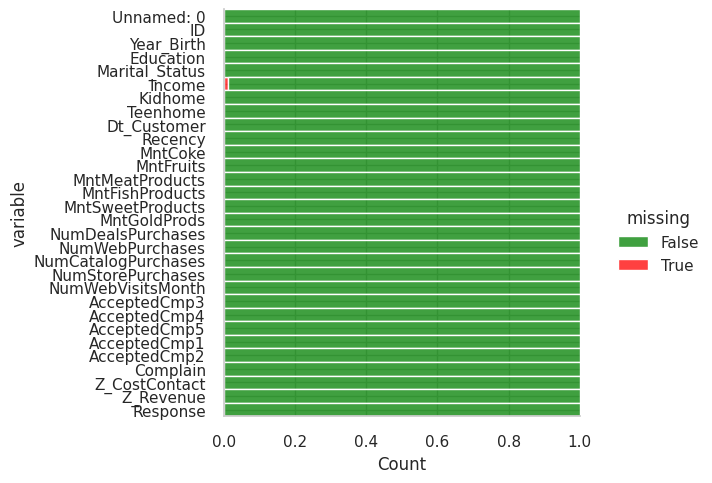

In [ ]:
plt.figure(figsize=(10,6))

dms = sns.displot(
    data=data.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25,
    palette = ["green","red"]
)

In [ ]:
data.dropna(inplace = True)

In [ ]:
data.isna().sum()

Unnamed: 0             0
ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntCoke                0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

# **FEATURE ENGINEERING**

### Create Age Column

In [ ]:
# SAS Institute, 2014
# currentYear = datetime.now().year
currentYear = 2014 # based on data
data['Age'] = currentYear - data['Year_Birth']


Will be simplified again:
- Young adult < 30 years
- Adult 30-45 years
- Senior Adult > 45 years

In [ ]:
def age_group(x):
    if x > 45:
        grup = 'Senior Adult'
    elif x > 30:
        grup = 'Adult'
    else:
        grup = 'Young Adult'

    return grup

data['Age_group'] = data["Age"].apply(lambda x: age_group(x))

### Create Has_child Column

In [ ]:
data['Has_child'] = np.where(data["Kidhome"]+data["Teenhome"] > 0, 'Yes', 'No')

### Create Dependents Column

In [ ]:
data['Dependents'] = data['Kidhome'] + data['Teenhome']

### Create Spending Column

In [ ]:
data['Spending']=data['MntCoke']+ \
    data['MntFruits']+ \
    data['MntMeatProducts']+ \
    data['MntFishProducts']+ \
    data['MntSweetProducts']+ \
    data['MntGoldProds']

### Create Total_Purchases Column

In [ ]:
data['Total_Purchases'] = data['NumDealsPurchases'] + \
    data['NumWebPurchases'] + \
    data['NumCatalogPurchases'] + \
    data['NumStorePurchases']

### Create Conversion Rate Column

In [ ]:
data['Conversion_rate_web'] = np.round(data['Total_Purchases'] / data['NumWebVisitsMonth'], 2)

### Create Total_Cmp Column

In [ ]:
data['Total_Cmp']=data['AcceptedCmp1'].astype("int64")+ \
    data['AcceptedCmp2'].astype("int64")+ \
    data['AcceptedCmp3'].astype("int64")+ \
    data['AcceptedCmp4'].astype("int64")+ \
    data['AcceptedCmp5'].astype("int64")

### Create Ever_Accept Column

In [ ]:
data['Ever_Accept']=data['Total_Cmp'].apply(lambda x : 1 if x >= 1 else 0)

### Marital_Status

In [ ]:
# Change the categories of Cerai, Janda, Duda to Cerai
data['Marital_Status_Simple'] = data['Marital_Status'].replace(['Janda', 'Duda'],'Cerai')
# Change the categories of Bertunangan, Menikah to Berpansangan
data['Marital_Status_Simple'] = data['Marital_Status'].replace(['Bertunangan', 'Menikah'],'Berpasangan')

In [ ]:
data['Marital_Status_Simple'].unique()

array(['Lajang', 'Berpasangan', 'Cerai', 'Janda', 'Duda'], dtype=object)

## Education

In [ ]:
data['Education'].unique()

array(['S1', 'S3', 'S2', 'SMA', 'D3'], dtype=object)

In [ ]:
data['Education_Simple'] = data['Education'].replace(['D3'],'S1')

### Create Income Segmentation Column

In [ ]:
Q1 = data["Income"].quantile(.25)
print(Q1)
Q3 = data["Income"].quantile(.75)
print(Q3)

def income_sgmt(x):
    if (x is None) or (type(x) not in [int, float]) :
        segment = "None"
    else:
        if x >= Q3:
            segment = "High"
        elif x < Q3 and x >= Q1:
            segment = "Medium"
        else:
            segment = "Low"
    return segment

data["Income_sgmt"] = data["Income"].fillna("None")
data["Income_sgmt"] = data["Income_sgmt"].apply(lambda x: income_sgmt(x))

35303000.0
68522000.0


### Result of the feature engineering and feature extraction

In [ ]:
data.drop(['Education',	'Marital_Status'], axis=1, inplace=True)

In [ ]:
data.sample()

,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_group,Has_child,Dependents,Spending,Total_Purchases,Conversion_rate_web,Total_Cmp,Ever_Accept,Marital_Status_Simple,Education_Simple,Income_sgmt
1242,1242,4138,1962,76624000.000000,0,1,24-05-2014,68,411000,106000,147000,54000,115000,66000,1,5,10,7,1,1,0,0,0,0,0,3,11,0,52,Senior Adult,Yes,1,899000,23,23.000000,1,1,Lajang,S1,High


# **EXPLORATORY DATA ANALYSIS**

# **UNIVARIATE ANALYSIS**

## Individual Boxplot

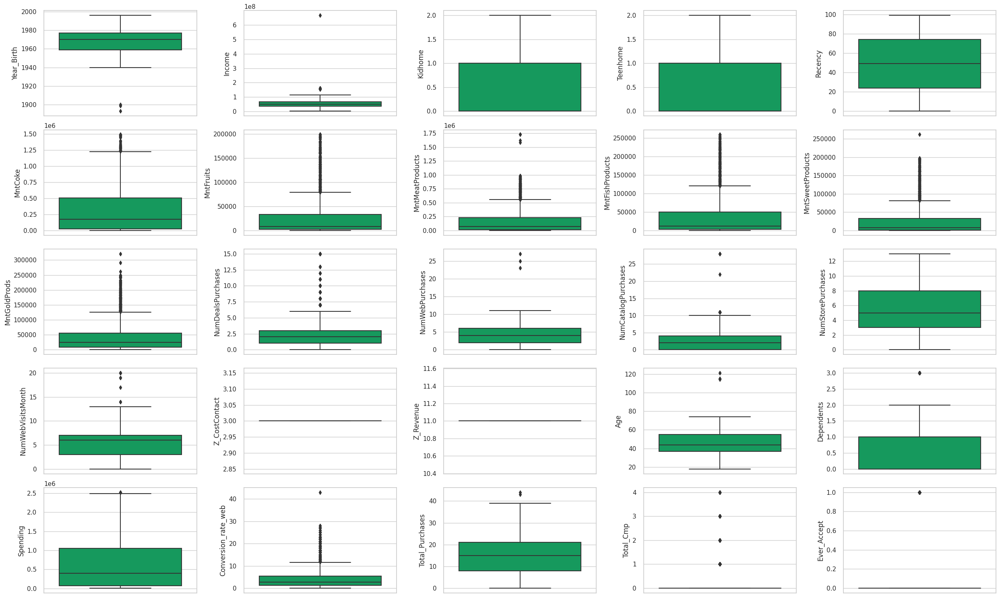

In [ ]:
plt.figure(figsize=(25, 15))
n = 5
for i in range(0, len(num_cols)):
    plt.subplot(n, math.ceil(len(num_cols)/n), i+1)
    sns.boxplot(y=data[num_cols[i]], color='#00af5f', orient='v')
    plt.tight_layout()

In [ ]:
print(f'Jumlah baris: {len(data)}')

outlier = []
no_outlier = []
is_outlier = []
low_lim = []
high_lim = []

filtered_entries = np.array([True] * len(data))
for col in num_cols:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    low_limit = Q1 - (IQR * 1.5)
    high_limit = Q3 + (IQR * 1.5)

    filter_outlier = ((data[col] >= low_limit) & (data[col] <= high_limit))
    outlier.append(len(data[~filter_outlier]))
    no_outlier.append(len(data[filter_outlier]))
    is_outlier.append(data[col][~filter_outlier].any())
    low_lim.append(low_limit)
    high_lim.append(high_limit)

    filtered_entries = ((data[col] >= low_limit) & (data[col] <= high_limit)) & filtered_entries

print("Outlier All Data :", len(data[~filtered_entries]))
print("Not Outlier All Data :", len(data[filtered_entries]))
print()

pd.DataFrame({
    "Column Name":num_cols,
    "is Outlier": is_outlier,
    "Lower Limit": low_lim,
    "Upper Limit": high_lim,
    "Outlier":outlier,
    "No Outlier":no_outlier
})

Jumlah baris: 2216
Outlier All Data : 995
Not Outlier All Data : 1221



,Column Name,is Outlier,Lower Limit,Upper Limit,Outlier,No Outlier
0,Year_Birth,True,1932.000000,2004.000000,3,2213
1,Income,True,-14525500.000000,118350500.000000,8,2208
2,Kidhome,False,-1.500000,2.500000,0,2216
3,Teenhome,False,-1.500000,2.500000,0,2216
4,Recency,False,-51.000000,149.000000,0,2216
5,MntCoke,True,-697500.000000,1226500.000000,35,2181
6,MntFruits,True,-44500.000000,79500.000000,246,1970
7,MntMeatProducts,True,-308375.000000,556625.000000,174,2042
8,MntFishProducts,True,-67500.000000,120500.000000,222,1994
9,MntSweetProducts,True,-47000.000000,81000.000000,246,1970


**Observations:**.

There are outliers in some columns

- In the `Year_of_Birth` column, the furthest outlier is below 1900.
- In the `Income` column, the furthest outlier is above 600,000,000.
- In the `MntCoke` column, the outliers are at 150,000,000 and above.
- In the `MntFruits` column the outliers are around 80,000 to 200,000.
- In the `MntMeatProducts` column, the furthest outliers are around 175,000.
- In the `MntFishProducts` column, the outliers are around 125,000 to over 250,000.
- In the `MntSweetProducts` column, the furthest outliers are around 250,000.
- In the `MntGoldProds` column, the furthest outliers are around 350,000.
- In the `NumDealsPurchases` column, the furthest outlier is 15.
- In the column `NumWebPurchases` the outlier is about 25.
- In the `NumCataloguePurchases` column, the furthest outlier is above 25.
- In the column `NumWebVisitsMonth` the furthest outlier is at 20.
- In the `Age` column, the furthest outlier is above 120.
- In the `Dependents` column, the furthest outlier is at 3.
- In the `Spending` column, the furthest outlier is above 2,500,000.
- In the column `Conversion_rate_web` the furthest outlier is above 40.
- In the column `Total_Purchases` the furthest outlier is above 40.

## Individual Histogram / Distplot

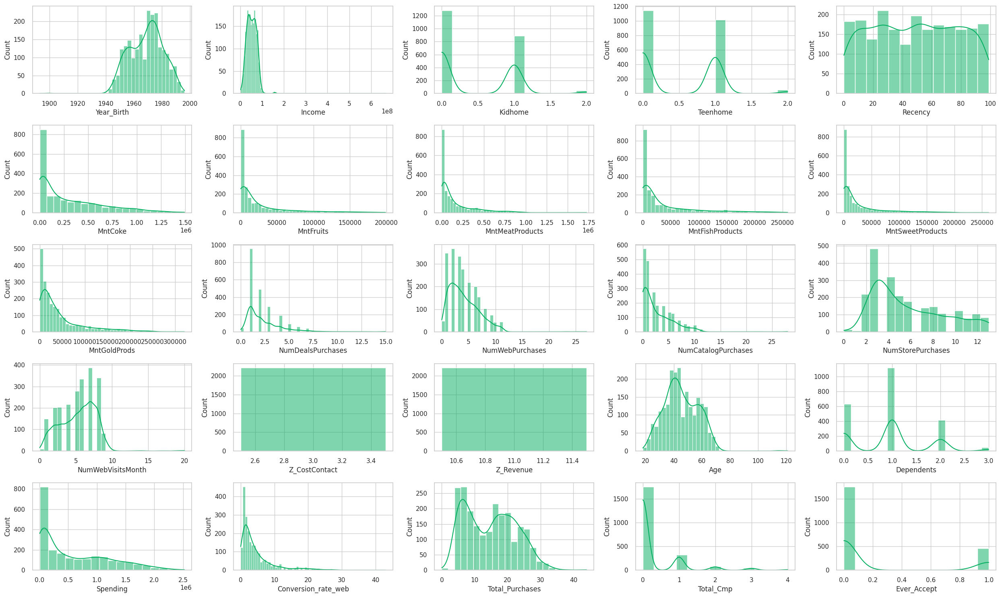

In [ ]:
plt.figure(figsize=(25, 15))
n = 5
for i in range(0, len(num_cols)):
    plt.subplot(n, math.ceil(len(num_cols)/n), i+1)
    sns.histplot(data[num_cols[i]], color='#00af5f', kde=True)
    plt.tight_layout()

Based on the **Boxplot, Distribution and Violin** graphs above, we can see that there are several variables that have **outliers** in them and some that have **skewed distributions**. Here are some of these variables:

1. Normal Distribution
    - Normal Distribution (Symmetric) `Recency` Normal Distribution (Symmetric)
    - `Year_Birth` Almost Normal Distribution (Symmetric)
    - Number_of_visits_month Fairly normal distribution (symmetric)
    
2. Non-uniform distribution  
    - `Z_CostContact` Uniform distribution - Has only one value
    - `Z_Revenue` Uniform distribution - Has only one value

3. Positively skewed distribution
    - Income `Income`
    - Number of wine products `MntCoke`
    - Number of fruit products `MntFruit`
    - Number of meat products `MntMeatProducts`
    - Number of fish products `MntFishProducts`
    - Number of sweet products `MntSweetProducts`
    - Number of gold products `MntGoldProds`
    - Number of Purchase Deals `NumDealsPurchases`
    - Number of web purchases `NumWebPurchases`
    - Number of catalogue purchases `NumCataloguePurchases`
    - Number of store purchases `NumStorePurchases`

4. Bimodal distribution
    - Number of young children in the household of `Kidhome` customers
    - Number of teenagers in the household of `Teenhome` clients

Data pre-processing recommendations:

Data with a 'positively skewed distribution' are 'log transformed' to make the data more reliable.

## Individual Countplot

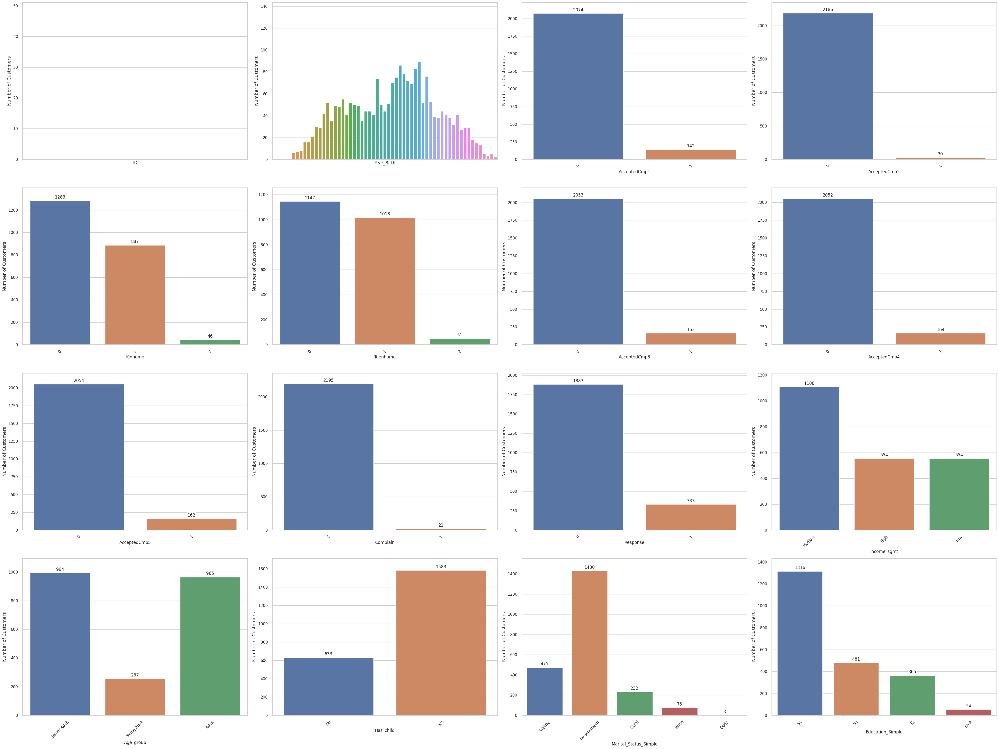

In [ ]:
cat = cat_cols.copy()
cat.insert(1, "Year_Birth")
cat.insert(4, "Kidhome")
cat.insert(5, "Teenhome")

n=4
fig = plt.figure(figsize=(40, 30))
for i in range(0, len(cat)):
    fig.add_subplot(n, math.ceil(len(cat)/n), i+1)
    bar = sns.countplot(x=data[cat[i]], orient='h')
    if cat[i] not in ["ID", "Year_Birth"]:
        for i in bar.patches:
            bar.annotate(int(i.get_height()),
                    xy=(i.get_x() + i.get_width() / 2, i.get_height()),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom',
                    bbox=dict(facecolor='white', edgecolor="None", pad=2))
    else :
        plt.xticks([])
    sns.color_palette("YlOrBr")
    plt.xticks(rotation=45)
    y_start, y_end = plt.ylim()
    plt.ylim(0, y_end+50)
    plt.ylabel('Number of Customers',fontsize=13)
    plt.tight_layout()

**Observations:**
- Too many categories in the `ID` and `Year_Birth` columns.
- The columns `Education` and `Marital_Status` have several categories with the same value and are ambiguous.
    - Category `Education`: the majority of customers have an education category of `S1` with 1316 people, but the value is very high compared to others.
    - In the 'Marital_Status' category, the majority of clients are `Berpasangan` (1430 people).
- Columns `Kidhome` and `Teenhome`: the majority of customers do not have children or teenagers (value 0).
- The value of the columns `AcceptedCmp1, AcceptedCmp2, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, Complain and Response` is dominated by the value 0 (no response / complaint).
- The target we have is in the 'Response' column, which has a very high imbalance (Imbalanced Data),
    - No response = 1883
    - Replies = 333

# **MULTIVARIATE ANALYSIS**

### Heatmap Correlation

In [ ]:
cat = data[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Complain', 'Response']].astype("int64")
dfhm = pd.concat([data[num_cols], cat], axis=1)

<Axes: >

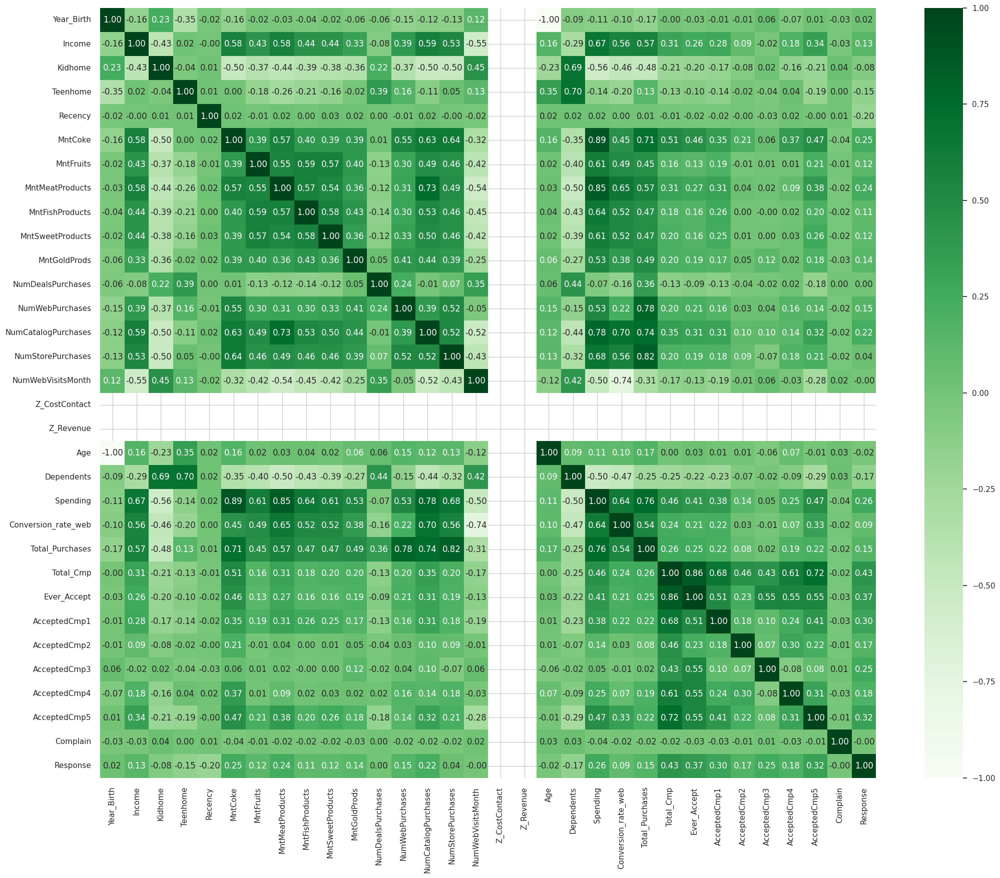

In [ ]:
plt.figure(figsize=(25,20))
sns.heatmap(dfhm.corr(), cmap='Greens', annot=True, fmt='.2f')

In [ ]:
corr = dfhm.corrwith(dfhm["Response"])
corr = corr.reset_index(name='corr value')
corr["Corr Type"] = corr["corr value"].apply(lambda x : "Positif" if x >= 0 else "Negatif")
corr["corr value"] = corr["corr value"].apply(lambda x : abs(x))
corr.sort_values('corr value', ascending=False, ignore_index=True)

,index,corr value,Corr Type
0,Response,1.000000,Positif
1,Total_Cmp,0.427124,Positif
2,Ever_Accept,0.367796,Positif
3,AcceptedCmp5,0.323374,Positif
4,AcceptedCmp1,0.297345,Positif
5,Spending,0.264127,Positif
6,AcceptedCmp3,0.254005,Positif
7,MntCoke,0.246299,Positif
8,MntMeatProducts,0.237746,Positif
9,NumCatalogPurchases,0.219914,Positif


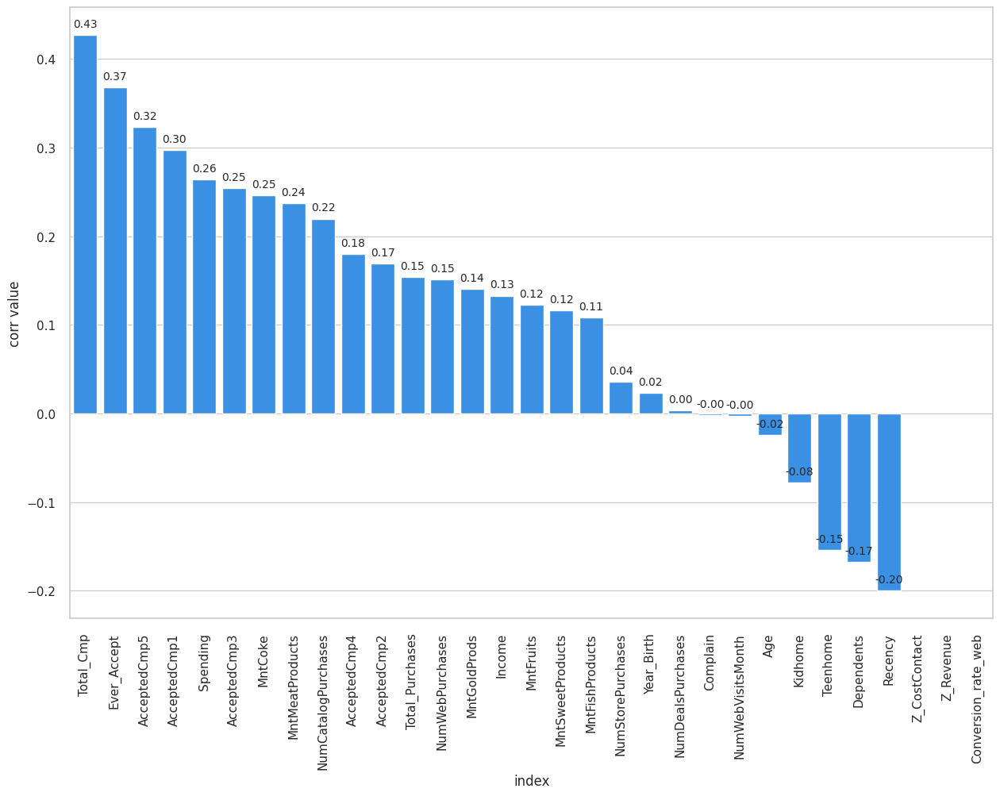

In [ ]:
corr = dfhm.corrwith(dfhm["Response"])
corr = corr.reset_index(name='corr value')
corr = corr.sort_values('corr value', ascending=False)[1:]

plt.figure(figsize=(15, 10))
ax = sns.barplot(x='index', y="corr value", data=corr, order=corr["index"], color='dodgerblue')
for p in ax.patches:
    ax.annotate(
        f'{p.get_height():0.2f}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha = 'center',
        va = 'center',
        xytext = (0, 10),
        fontsize=10,
        textcoords = 'offset points')
plt.xticks(rotation=90)
plt.show()

- Correlation to Target **(Response)**.
    - Top 10 Highly Correlated to Target as follows, most likely this top may be the most relevant feature and should be retained:
        - `Total_Cmp` - 0.43 - Positive
        - `Ever_Accept` - 0.37 - Positive
        - `AcceptedCmp5` - 0.32 - Positive
        - `AcceptedCmp1` - 0.30 - Positive
        - `Spending` - 0.26 - Positive
        - `AcceptedCmp3` - 0.25 - Positive
        - `MntCoke` - 0.25 - Positive
        - `MntMeatProducts` - 0.24 - Positive
        - `NumCataloguePurchases` - 0.22 - Positive
        - `Recency` - 0.20 - Negative

    - The correlation of the **Response** column with other columns tends to be low. All the feature-target correlations are in the `range from 0.00 to 0.43`. I have therefore decided to set the `threshold' at 0.15. The features above that we are likely to keep are those with a correlation value of `>0.15`.
    - The correlation of the **Response** column with the **AcceptedCmp5** column is the highest compared to the previous campaign columns.
    - The products offered in the last campaign (**Response** column) are somewhat similar to the 5th campaign (**AcceptedCmp5**).
    - Customers tend to be more interested in wine and meat, as shown by the correlation of the **Response** column with the **MntCoke** and **MntMeatProducts** columns.
    - Customers also prefer catalogue purchases (column **NumCataloguePurchases**) over others.
    
  Correlation between Feature

    - **MntMeatProduct** has a large positive correlation with **NumCatalogPurchases**, it can be said that most of the purchases of meat products are made through catalogues (the correlation is 0.73), so there may be redundancies in the data, so what is dropped is **NumCatalogPurchases** because it has a lower correlation with the target (response).

    In addition, there is an interesting pattern in the correlation between the characteristics as follows:

    - **Year of birth**.
        - **Year_of_Birth** is positively correlated with **Kidhome**, it can be said that the younger the customer, the more children, while for the column **Teenhome** it is negatively correlated or the older the customer, the more teenage children.
    - **Kidhome & Teenhome**.
        - Clients who (**Kidhome**) have young children **Income** tends to be low
        - Customers who (**Kidhome**) have young children tend to visit the web more often and buy when it is on sale.
        - Customers who (**Teenhome**) have teenagers tend to buy more when it is on sale
    - Income
        - Customers with a high **Income** tend to make more purchases
        - The **Income** column is significantly positively correlated with **MntCoke, MntFruits, MntMeatProduct, MntFishProduct, MntSweetProduct and MntGoldProduct**.
        - The column **Income** is moderately positively correlated with **NumWebPurchases**, NumCataloguePurchases and NumStores.
    - Product
        - The **MntCoke** column is moderately positively correlated with **MntMeatProduct**, it is likely that when a customer buys wine, they also buy meat.
        - The column **MntFruits** is moderately positively correlated with **MntMeatProduct, MntFishProduct and MntSweetProduct**, it is likely that when the customer buys these products together, they also buy meat.
        - **MntMeatProduct** is moderately positively correlated with **NumCatalogPurchases**, suggesting that most purchases of meat products are made through catalogues.
        - **MntCoke** is more likely to be purchased through a catalogue than through other purchase methods.
    - Purchases
        - The column **NumDealsPurchases** is positively correlated with NumWebVisitMonth, when there is a discount, the number of customers visiting the web increases.
        - The column **NumWebVisitMonth** is significantly negatively correlated with **NumCatalogPurchases and NumStorePurchases**, when customers visit the web more often, catalogue and store purchases decrease.
    - **Additional**.
        - Customers who buy coke (**MntCoke**) are likely to buy meat (**MntMeatProducts**) and prefer to buy directly from **Store**, **Catalogue** and **Website**.
        - Some of the **Fruit** combinations that are highly preferred by customers are **Fruit** and **Meat**, **Fruit** and **Fish**, or **Fruit** and **Sweet**. Customers also feel more comfortable buying directly from the **store** or **catalogue** than from the website.
- The combination of 5 product columns has a high correlation value. Therefore, customers tend to buy more than 1 product in one shopping trip.
**Coke** and **Gold** products are most often bought via **website**. While **Fruit**, **Meat**, **Fish** and **Sweets** are bought via **Store** and **Catalogue**.
Products offered through **Deals** (discounted prices) have not really attracted customers as the correlation with any product column is very low.
Customers using **Deals** are more likely to use **Website** to buy goods/products.
        
   Based on the initial analysis between features that we did on the features that have a higher correlation with the target, we got the following results:

    - `Recency`: The correlation value of Recency with other characteristics is between 0.00 and 0.05.

    - `MntCoke` : Feature that correlates with MntCoke:
    
        Income = 0.58, NumCatalogPurchases = 0.59, NumStorePurchases = 0.53

    - `MntMeatProducts`: Characteristics correlated with MntMeatProducts:
    
        NumCatalogPurchases = 0.73, Income = 0.58, MntCoke = 0.57

    - `NumCataloguePurchases`: Characteristic that correlates with NumCataloguePurchases:
    
        MntMeatProducts = 0.73, MntCoke = 0.63, Income = 0.59

    - `AcceptedCmp3` : Characteristic that correlates with AcceptedCmp3:

        MntGoldProducts = 0.12

    - `AcceptedCmp5` : Characteristic that correlates with AcceptedCmp5:
    
        MntCoke = 0.47, MntMeatProducts = 0.38, Income = 0.34

    - `AcceptedCmp1` : Characteristics that correlate with AcceptedCmp1:
    
        AcceptedCmp5 = 0.41, MntCoke = 0.35, MntMeatProducts = 0.31, NumCatalogPurchases = 0.31

    From these results, it is likely to be used as a priority feature for determining features for classifying customer responses.

### Pairplot

<Figure size 1500x1500 with 0 Axes>

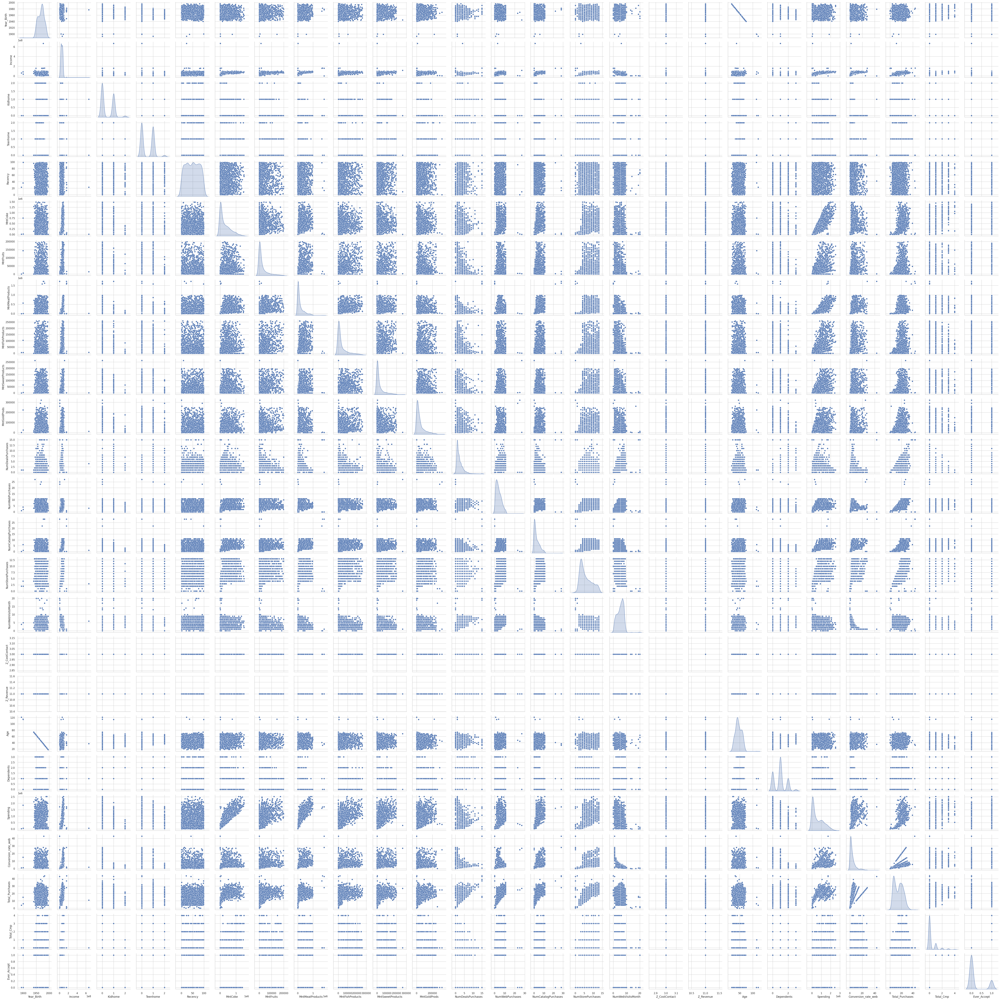

In [ ]:
plt.figure(figsize=(15,15))
sns.pairplot(data[num_cols], diag_kind='kde')

## Boxplot Based on Response

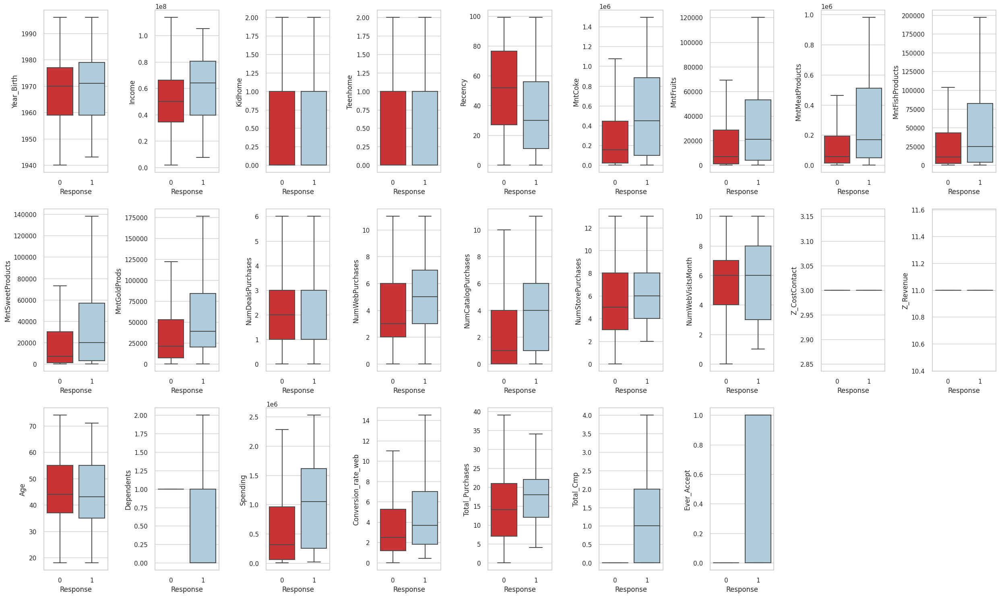

In [ ]:
plt.figure(figsize=(25, 15))
colors=["#e31a1c", "#a6cee3"]
n = 3
for i in range(0, len(num_cols)):
    plt.subplot(n, math.ceil(len(num_cols)/n), i+1)
    sns.boxplot(x=data["Response"], y=data[num_cols[i]], orient='v', palette=colors, showfliers=False)
    # sns.boxplot(x=df["Response"], y=df[num_cols[i]], orient='v', palette=colors)
    plt.tight_layout()

Based on the boxplot analysis above, by adding the `Response` characteristic as a comparison variable, we can find some *insights* as follows:

There are several variables that show significant differences when looking at the distance between the medians of customers who respond and customers who do not respond, such as: `Income`, `Recency`, `MntCoke`, `MntFruits`, `MntMeatProducts`, `MntFishProducts`, `MntSweetProducts`, `MntGoldProducts`, `NumberWebPurchases`, `NumberCatalogPurchases` and `NumberStorePurchases`.
Here is the explanation:

- On the `Income` variable, customers who *respond to the campaign* tend to have a higher income, with an average income of around 65000, compared to customers who *don't respond to the campaign*, with an average income of only around 50000.
- On the `Recency` variable, customers who *respond to the campaign* tend to be more active shoppers with an average last day of product purchase of around 30 days, compared to customers who *don't respond to the campaign* with an average last day of product purchase of more than 50 days.
- For the variable `MntCoke`, customers who *respond to the campaign* tend to buy more Wines products, with an average Wines product purchase of around \\450,000 over 2 years, compared to customers who *don't respond to the campaign*, with an average Wines product purchase of less than \\2,000,000 over 2 years.
- In the variable `MntFruits`, customers who *respond to the campaign* tend to buy more Fruits products with an average Fruits purchase of more than \\200,000 over 2 years, compared to customers who *don't respond to the campaign* with an average Fruits purchase of less than \\50,000 over 2 years.
- In the `MntMeatProducts` variable, customers who *respond to the campaign* tend to buy more meat products, with an average purchase of meat products of more than \\1,900,000 over 2 years, compared to customers who *don't respond to the campaign* with an average purchase of meat products of less than \\500,000 over 2 years.
- In the `MntFishProducts` variable, customers who *respond to the campaign* tend to buy more fish products, with an average purchase of fish products of around \\250,000 over 2 years, compared with customers who *don't respond to the campaign*, with an average purchase of fish products of less than \\50,000 over 2 years.
- In the `MntSweetProducts` variable, customers who *respond to the campaign* tend to buy more sweet products, with an average purchase of sweet products of around \\200,000 over 2 years, compared to customers who *don't respond to the campaign* with an average purchase of sweet products of less than \\50,000 over 2 years.
- In the `MntGoldProducts` variable, customers who *respond to campaigns* tend to buy more Gold products, with an average purchase of Gold products around \\400,000 over 2 years, compared to customers who *don't respond to campaigns* with an average purchase of Gold products less than \\50,000 over 2 years.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2216 entries, 0 to 2239
Data columns (total 40 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             2216 non-null   int64  
 1   ID                     2216 non-null   int64  
 2   Year_Birth             2216 non-null   int64  
 3   Income                 2216 non-null   float64
 4   Kidhome                2216 non-null   int64  
 5   Teenhome               2216 non-null   int64  
 6   Dt_Customer            2216 non-null   object 
 7   Recency                2216 non-null   int64  
 8   MntCoke                2216 non-null   int64  
 9   MntFruits              2216 non-null   int64  
 10  MntMeatProducts        2216 non-null   int64  
 11  MntFishProducts        2216 non-null   int64  
 12  MntSweetProducts       2216 non-null   int64  
 13  MntGoldProds           2216 non-null   int64  
 14  NumDealsPurchases      2216 non-null   int64  
 15  NumW

# FEATURE TRANSFORMATION

## Log Transformation

In [ ]:
log_cols = ['Conversion_rate_web', 'MntFishProducts', 'MntFruits', 'MntGoldProds', 'MntMeatProducts', 'MntSweetProducts', 'MntCoke', 'NumCatalogPurchases', 'NumDealsPurchases', 'NumStorePurchases', 'NumWebPurchases', 'Spending']
norm_cols = ['Age', 'Income', 'NumWebVisitsMonth', 'Recency', 'Total_Purchases', 'Year_Birth']

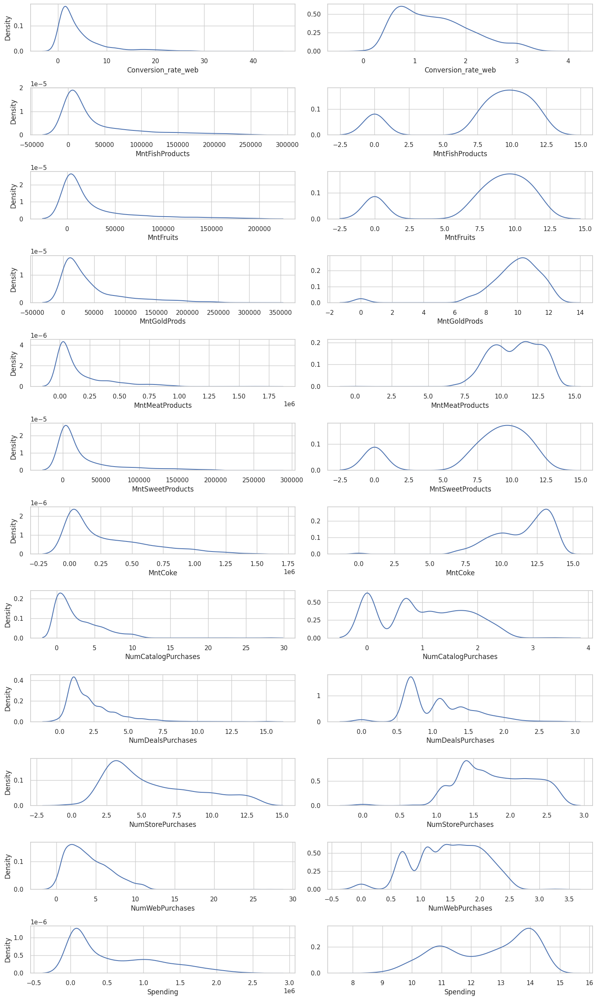

In [ ]:
fig, ax = plt.subplots(len(log_cols),2,figsize=(15,25))
for i in range(0,len(log_cols)):
    kde1 = sns.kdeplot(data[log_cols[i]], ax=ax[i][0])
    kde2 = sns.kdeplot(np.log(data[log_cols[i]]+1), ax=ax[i][1])
    kde2.set_ylabel(None)
    plt.tight_layout()

In [ ]:
# add 1 bcs err : divide by zero encountered in log
data[log_cols] = np.log(data[log_cols]+1)
data[log_cols] = np.log1p(data[log_cols])

In [ ]:
data[log_cols].describe()

,Conversion_rate_web,MntFishProducts,MntFruits,MntGoldProds,MntMeatProducts,MntSweetProducts,MntCoke,NumCatalogPurchases,NumDealsPurchases,NumStorePurchases,NumWebPurchases,Spending
count,2214.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000,2216.000000
mean,inf,1.970100,1.922349,2.326985,2.473277,1.905232,2.504091,0.615092,0.706902,1.014469,0.878818,2.597942
std,NaN,0.903131,0.904784,0.409956,0.148981,0.921236,0.248752,0.419205,0.223445,0.184689,0.250558,0.113109
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.253121
25%,0.593841,2.197969,2.151925,2.313039,2.368411,2.067970,2.405670,0.000000,0.526589,0.869742,0.741276,2.496660
50%,0.832992,2.341108,2.301316,2.407507,2.495457,2.301316,2.570295,0.741276,0.741276,1.026672,0.959135,2.631200
75%,1.054940,2.469776,2.433990,2.479318,2.591934,2.433990,2.648464,0.959135,0.869742,1.162283,1.080418,2.698834
max,inf,2.600063,2.580298,2.615876,2.731815,2.600918,2.722367,1.474144,1.327761,1.291725,1.466077,2.756317


## Normalization

In [ ]:
from sklearn.preprocessing import MinMaxScaler
# create a scaler object
scaler = MinMaxScaler()
# fit and transform the data
data[norm_cols] = pd.DataFrame(scaler.fit_transform(data[norm_cols]), columns=data[norm_cols].columns)

In [ ]:
data[norm_cols].describe()

,Age,Income,NumWebVisitsMonth,Recency,Total_Purchases,Year_Birth
count,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000,2193.000000
mean,0.263982,0.076061,0.265595,0.495627,0.338422,0.736018
std,0.116319,0.037894,0.121458,0.292347,0.174398,0.116319
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.184466,0.050519,0.150000,0.242424,0.181818,0.640777
50%,0.252427,0.074717,0.300000,0.494949,0.340909,0.747573
75%,0.359223,0.100649,0.350000,0.747475,0.477273,0.815534
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# **FEATURE ENCODING**

## Label Encoding

In [ ]:
cat_str = ['Education_Simple', 'Marital_Status_Simple', 'Age_group', 'Income_sgmt']

In [ ]:
#cek unique value
for x in cat_str:
    unq = list(data[x].unique())
    sorted(unq)

    print (f'===== {x} =====')
    if len(unq) >= 10:
        unq = list(unq[:10])+['.....']
        print (f'{unq}')
    else:
        print (f'{unq}')
    print()

===== Education_Simple =====
['S1', 'S3', 'S2', 'SMA']

===== Marital_Status_Simple =====
['Lajang', 'Berpasangan', 'Cerai', 'Janda', 'Duda']

===== Age_group =====
['Senior Adult', 'Young Adult', 'Adult']

===== Income_sgmt =====
['Medium', 'High', 'Low']



In [ ]:
map_edu = {
    'SMA' : 0,
    'S1' : 1,
    'S2' : 2,
    'S3' : 3
}

data['Education_Simple'] = data['Education_Simple'].map(map_edu)
data['Education_Simple'].unique()

array([1, 3, 2, 0])

In [ ]:
map_age = {
    'Young Adult' : 0,
    'Adult' : 1,
    'Senior Adult' : 2
}

data['Age_group'] = data['Age_group'].map(map_age)
data['Age_group'].unique()

array([2, 0, 1])

In [ ]:
map_income = {
    'Low' : 0,
    'Medium' : 1,
    'High' : 2
}

data['Income_sgmt'] = data['Income_sgmt'].map(map_income)
data['Income_sgmt'].unique()

array([1, 2, 0])

In [ ]:
data.head()

,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_group,Has_child,Dependents,Spending,Total_Purchases,Conversion_rate_web,Total_Cmp,Ever_Accept,Marital_Status_Simple,Education_Simple,Income_sgmt
0,0,5524,0.621359,0.084832,0,0,04-09-2012,0.585859,2.664543,2.516494,2.653972,2.569191,2.516494,2.516494,0.869742,1.162283,1.223156,0.959135,0.350000,0,0,0,0,0,0,3,11,1,0.378641,2,No,0,2.727597,0.568182,0.924066,0,0,Lajang,1,1
1,1,2174,0.592233,0.067095,1,1,08-03-2014,0.383838,2.332701,2.067970,2.272093,2.151925,2.067970,2.272093,0.741276,0.526589,0.526589,0.741276,0.250000,0,0,0,0,0,0,3,11,0,0.407767,2,Yes,2,2.416238,0.136364,0.581353,0,0,Lajang,1,1
2,2,4141,0.699029,0.105097,0,0,21-08-2013,0.262626,2.636353,2.468065,2.545684,2.535068,2.393552,2.454915,0.526589,1.162283,0.741276,1.223156,0.200000,0,0,0,0,0,0,3,11,0,0.300971,2,No,0,2.678409,0.477273,1.041188,0,0,Berpasangan,1,2
3,3,6182,0.883495,0.037471,1,0,10-02-2014,0.262626,2.332701,2.229401,2.389087,2.323411,2.197969,2.253121,0.741276,0.741276,0.000000,0.959135,0.300000,0,0,0,0,0,0,3,11,0,0.116505,0,Yes,1,2.474694,0.181818,0.612950,0,0,Berpasangan,1,0
4,4,5324,0.854369,0.085065,1,0,19-01-2014,0.949495,2.569635,2.456934,2.539904,2.462697,2.416238,2.362350,1.026672,1.026672,0.869742,1.080418,0.250000,0,0,0,0,0,0,3,11,0,0.145631,1,Yes,1,2.635678,0.431818,0.943367,0,0,Berpasangan,3,1


## One Hot Encoding

In [ ]:
from sklearn.preprocessing import OneHotEncoder

oh = OneHotEncoder()
df_ohe = pd.DataFrame(
    oh.fit_transform(data[["Marital_Status_Simple"]]).toarray(),
    columns=list(oh.categories_[0])
)
print(oh.categories_[0])

data.drop("Marital_Status_Simple", axis=1, inplace=True)

data = pd.concat([data, df_ohe], axis=1)

['Berpasangan' 'Cerai' 'Duda' 'Janda' 'Lajang']


In [ ]:
data.head()

,Unnamed: 0,ID,Year_Birth,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntCoke,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Age_group,Has_child,Dependents,Spending,Total_Purchases,Conversion_rate_web,Total_Cmp,Ever_Accept,Education_Simple,Income_sgmt,Berpasangan,Cerai,Duda,Janda,Lajang
0,0.000000,5524.000000,0.621359,0.084832,0.000000,0.000000,04-09-2012,0.585859,2.664543,2.516494,2.653972,2.569191,2.516494,2.516494,0.869742,1.162283,1.223156,0.959135,0.350000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,1.000000,0.378641,2.000000,No,0.000000,2.727597,0.568182,0.924066,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
1,1.000000,2174.000000,0.592233,0.067095,1.000000,1.000000,08-03-2014,0.383838,2.332701,2.067970,2.272093,2.151925,2.067970,2.272093,0.741276,0.526589,0.526589,0.741276,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.000000,0.407767,2.000000,Yes,2.000000,2.416238,0.136364,0.581353,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
2,2.000000,4141.000000,0.699029,0.105097,0.000000,0.000000,21-08-2013,0.262626,2.636353,2.468065,2.545684,2.535068,2.393552,2.454915,0.526589,1.162283,0.741276,1.223156,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.000000,0.300971,2.000000,No,0.000000,2.678409,0.477273,1.041188,0.000000,0.000000,1.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000
3,3.000000,6182.000000,0.883495,0.037471,1.000000,0.000000,10-02-2014,0.262626,2.332701,2.229401,2.389087,2.323411,2.197969,2.253121,0.741276,0.741276,0.000000,0.959135,0.300000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.000000,0.116505,0.000000,Yes,1.000000,2.474694,0.181818,0.612950,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
4,4.000000,5324.000000,0.854369,0.085065,1.000000,0.000000,19-01-2014,0.949495,2.569635,2.456934,2.539904,2.462697,2.416238,2.362350,1.026672,1.026672,0.869742,1.080418,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.000000,0.145631,1.000000,Yes,1.000000,2.635678,0.431818,0.943367,0.000000,0.000000,3.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
